In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import pickle
from collections import defaultdict
from sklearn.manifold import TSNE

## how does the sampled data point look like? which are sampled, unlabeled, labeled?

In [3]:
def read_embedding_results(cylce):
    features = np.load(f'{base_path}/{folder}_{cycle}_features.npy')
    features_label = np.load(f'{base_path}/{folder}_{cycle}_features_label.npy')
    labeled_indices = np.load(f'{base_path}/{folder}_{cycle}_labeled_indices.npy')

    return [features, features_label, labeled_indices]

dataset = 'SnapshotSerengetiSmall'
method = 'mobyv2al'
run_id = 20240624
base_path = f'/Volumes/data01/waitsun/result_data_analysis/{dataset}_{method}_{run_id}'
folder = f'{dataset}_{method}_{run_id}'
features, features_label, labeled_indices = [],[],[]

for cycle in range(10):
    results = read_embedding_results(cycle)
    features.append(results[0])
    features_label.append(results[1])
    labeled_indices.append(results[2])





In [68]:
for i in range(10):
    print(features[i].shape)

(254484, 512)
(256984, 512)
(259484, 512)
(261984, 512)
(264484, 512)
(266984, 512)
(269484, 512)
(271984, 512)
(274484, 512)
(276984, 512)


In [3]:
tsne_embeddings = []
for i in range(10):
    tsne = TSNE(n_components=2, random_state=1234,n_jobs=-1)
    tmp = tsne.fit_transform(features[i])
    tsne_embeddings.append(tmp)

/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(
/Users/waitsun/miniforge3/envs/al-project/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE w

In [6]:
import pickle

with open('tsne_embeddings_label_dispersion.pkl', 'wb') as file:
    pickle.dump(tsne_embeddings, file)


In [7]:
import random
NUM_TRAIN = 512522
indices = list(range(NUM_TRAIN))
random.seed(1234)
random.shuffle(indices)

512522

In [8]:
sampled_indices = []
sampled_indices_position = []
for i in range(0,10,1):
    if i <=0:
        tmp = [(li, index) for  index,li in enumerate(labeled_indices[i]) if li not in indices[:5000]]
        tmp,pos = zip(*tmp)
    else:    
        tmp = [(li,index) for  index,li in enumerate(labeled_indices[i]) if li not in labeled_indices[i-1]]
        tmp,pos = zip(*tmp)
    sampled_indices.append(tmp)
    sampled_indices_position.append(pos)



In [9]:
sampled_labels = []
for i in range(10):
    tmp = [features_label[i][index] for index in sampled_indices_position[i]]
    sampled_labels.append(tmp)

    

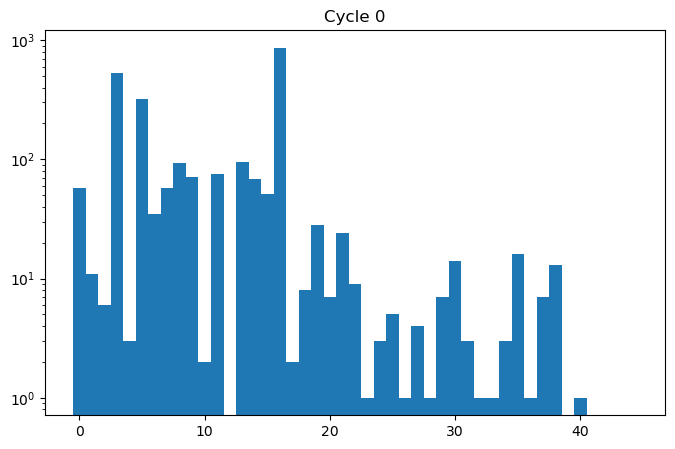

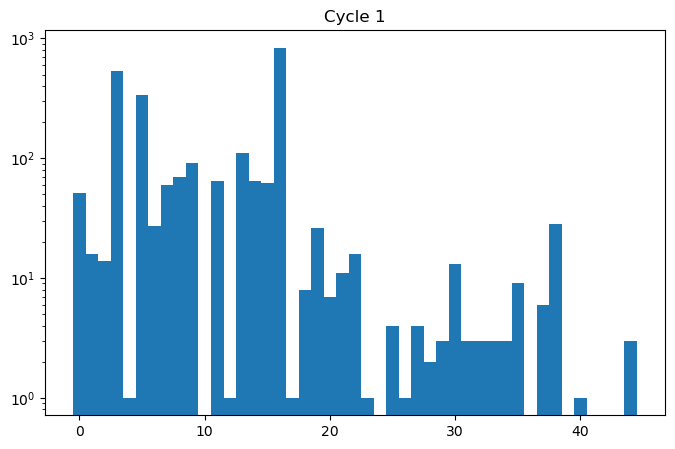

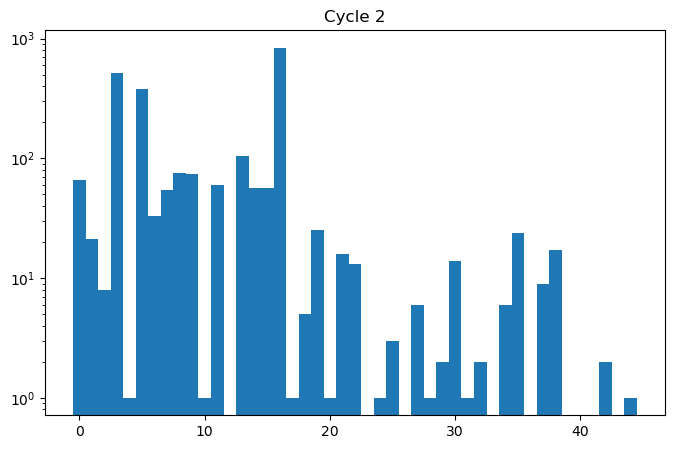

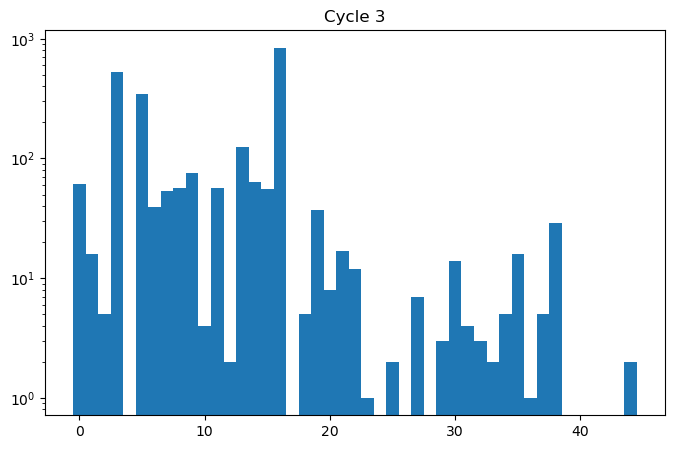

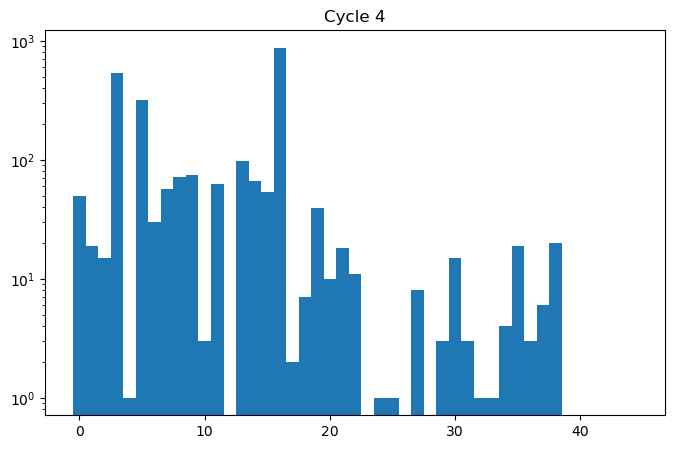

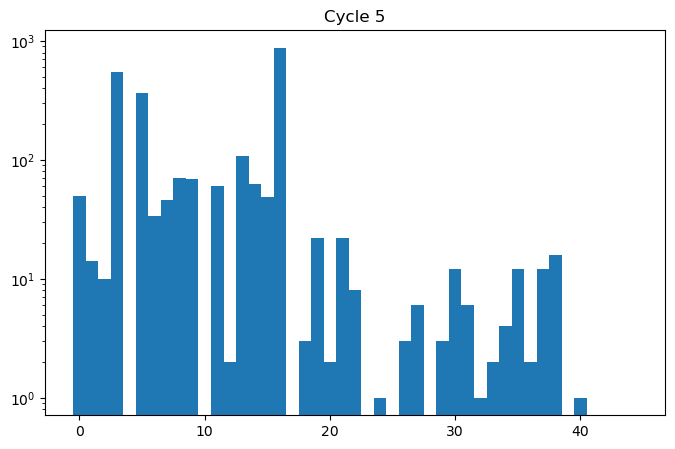

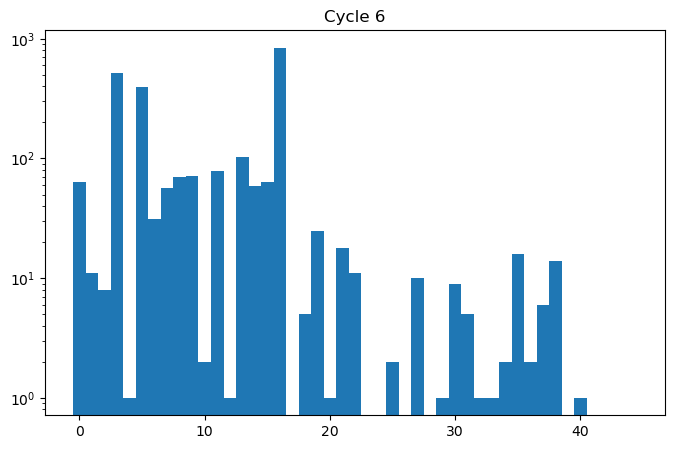

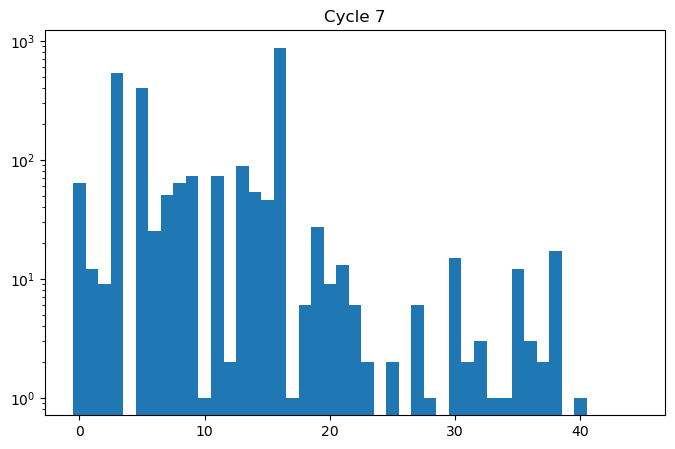

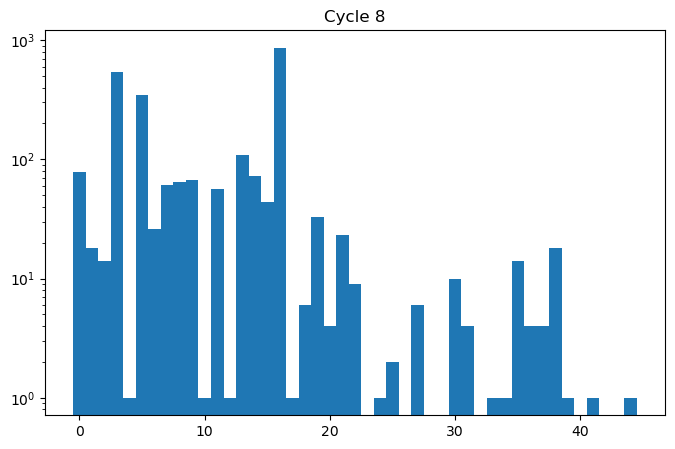

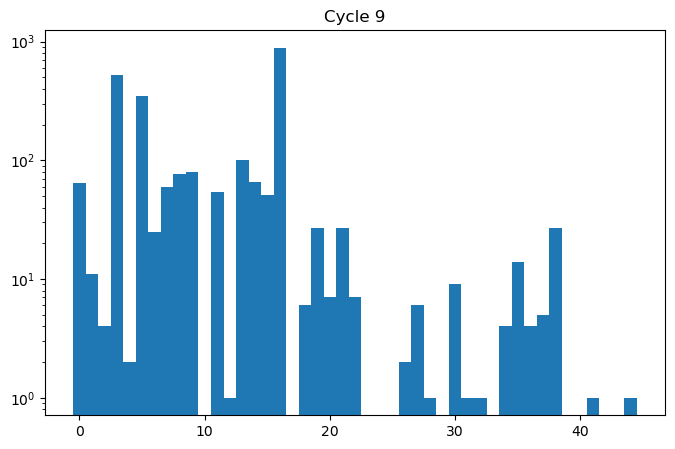

In [69]:
for i in range(10):
    fig, ax = plt.subplots(figsize=(8,5))
    ax.hist(sampled_labels[i],bins=np.arange(0,46,1),align='left')
    ax.set_yscale('log')
    ax.set_title(f'Cycle {i}')

In [11]:
lut = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_category_lut_adapted.df')

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1197/3059673365.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(species_name,rotation=90)


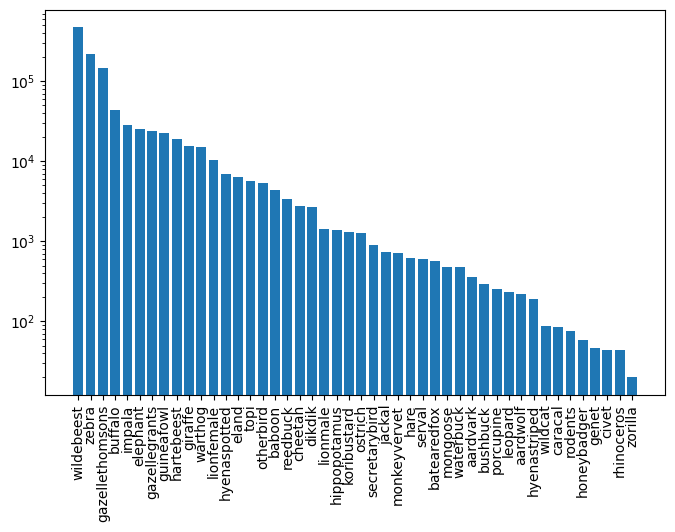

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1197/3059673365.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(species_name,rotation=90)


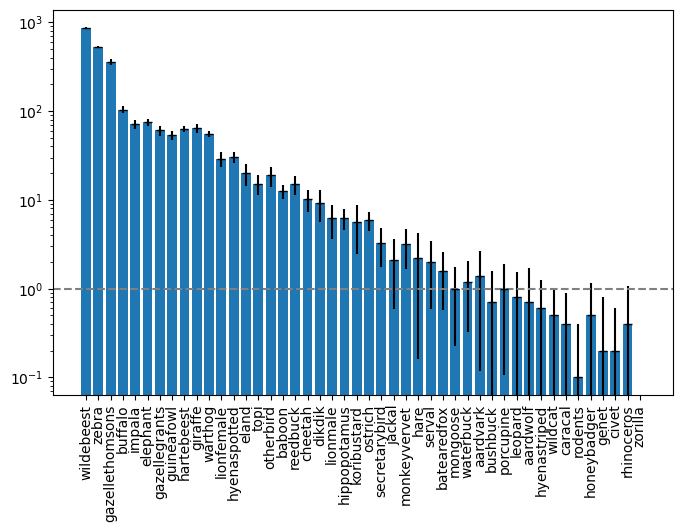

In [226]:
df_test = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_test.df')
df_train = pd.read_pickle('/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_train.df')

category, num = zip(*list(df_train['category_id'].value_counts().items()))

category = np.array(category)
num = np.array(num)

sorted_a = np.argsort(category)
species_name = [lut.name[i] for i in category]
fig, ax = plt.subplots(figsize=(8,5))
ax.bar(species_name,num,log=True)
ax.set_xticklabels(species_name,rotation=90)
plt.show()

counts_mean = np.zeros((10,46))
for i in range(10):
    unique_values, counts = np.unique(sampled_labels[i],return_counts=True)
    for j in range(len(unique_values)):
        counts_mean[i,unique_values[j]] = counts[j]

counts_std = counts_mean.std(axis=0)
counts_mean = counts_mean.mean(axis=0)

fig, ax = plt.subplots(figsize=(8,5))
ax.bar(species_name,counts_mean[category],log=True)
ax.errorbar(species_name,counts_mean[category],yerr=counts_std[category],fmt='_',color='black')
ax.set_xticklabels(species_name,rotation=90)
ax.axhline(y=1, color='grey', linestyle='--')
plt.show()

In [227]:
np.save('counts_mean_labeldispersion.npy',counts_mean)
np.save('counts_std_labeldispersion.npy',counts_std)

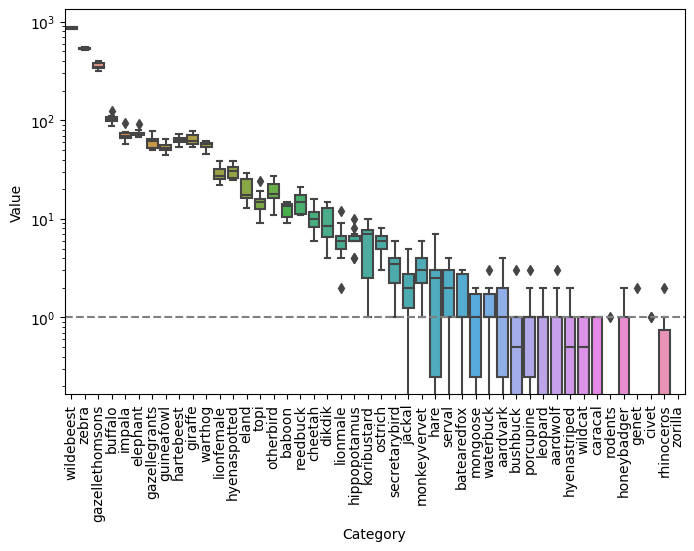

In [228]:
import seaborn as sns

bbox = {
    'Category': [],
    'Value': []
}

for i in range(len(sampled_labels)):
    unique_values, counts = np.unique(sampled_labels[i],return_counts=True)
    for cat_id, count in zip(unique_values,counts):
        bbox['Category'].append(cat_id)
        bbox['Value'].append(count)

    for i in range(46):
        if i not in unique_values:
            bbox['Category'].append(i)
            bbox['Value'].append(0)

df = pd.DataFrame(bbox)
df['Category'] = pd.Categorical(df['Category'], categories=category.tolist(), ordered=False)
df = df.sort_values('Category')
fig, ax = plt.subplots(figsize=(8,5))
sns.boxplot(data= df, x='Category', y='Value',ax=ax)
# ax.errorbar(species_name,counts_mean[category],yerr=counts_std[category],fmt='_',color='black')
ax.set_xticklabels(species_name,rotation=90)
ax.axhline(y=1, color='grey', linestyle='--')
# ax.set_ylim(0,10)
ax.set_yscale('log')
plt.show()

In [229]:
pd.to_pickle(df,'boxplot_labeldispersion.df')

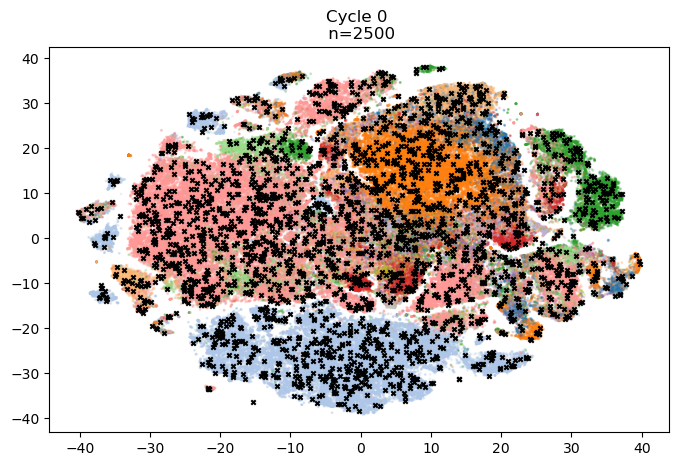

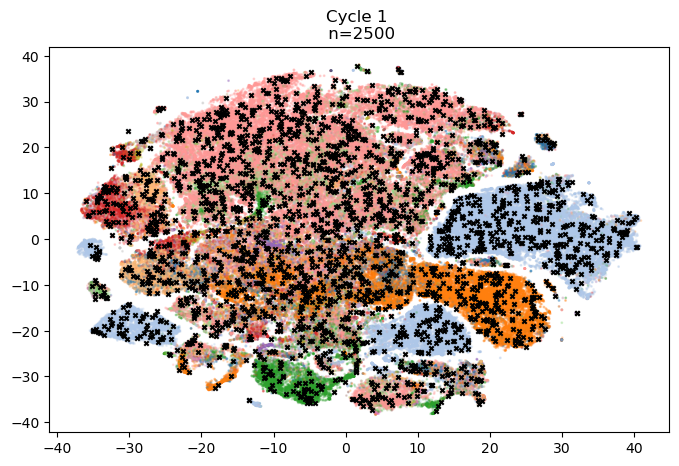

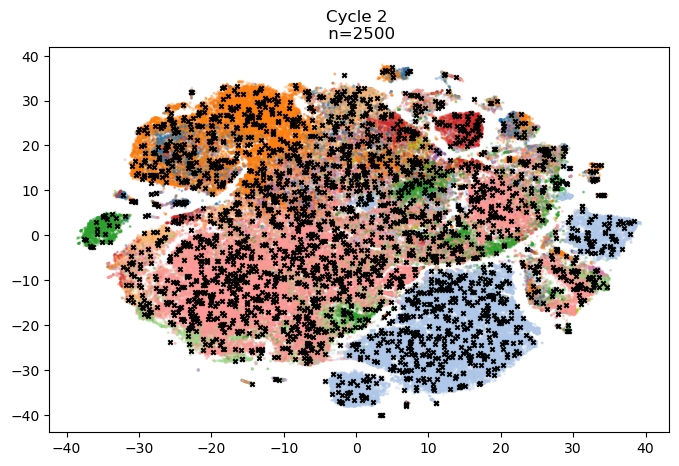

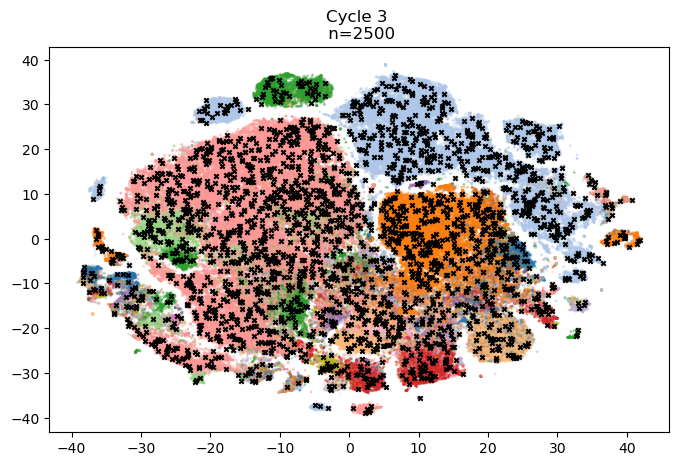

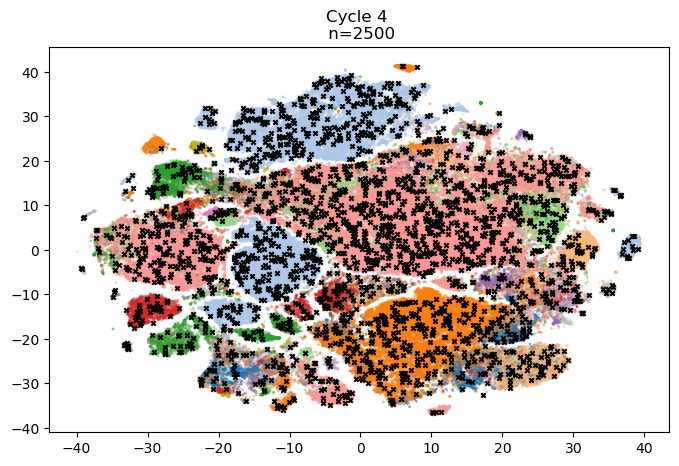

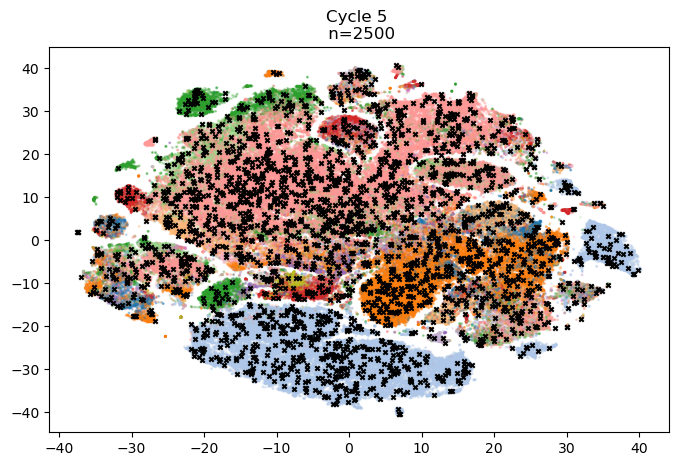

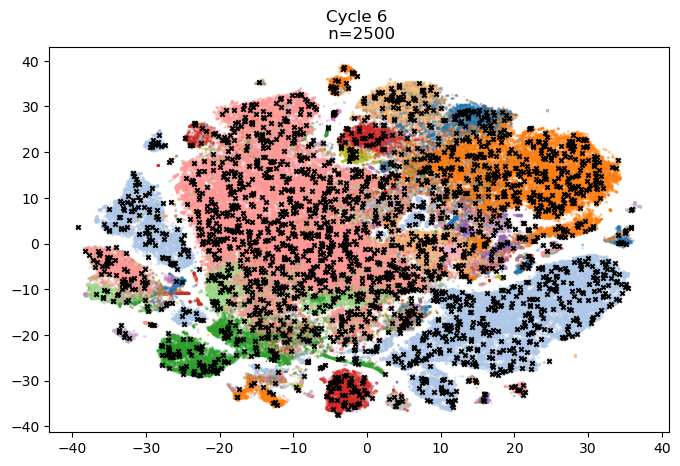

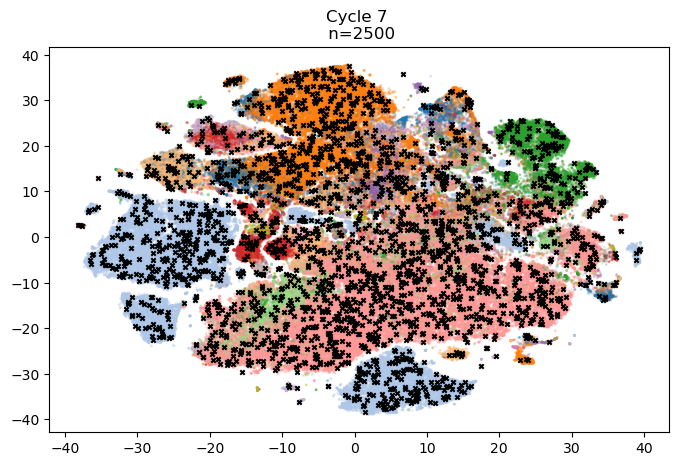

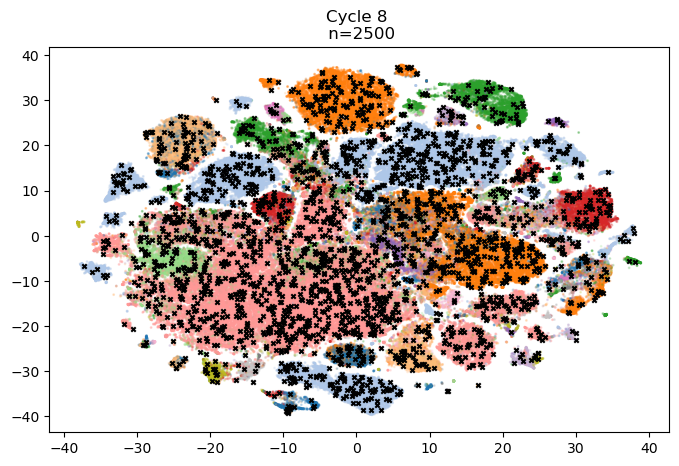

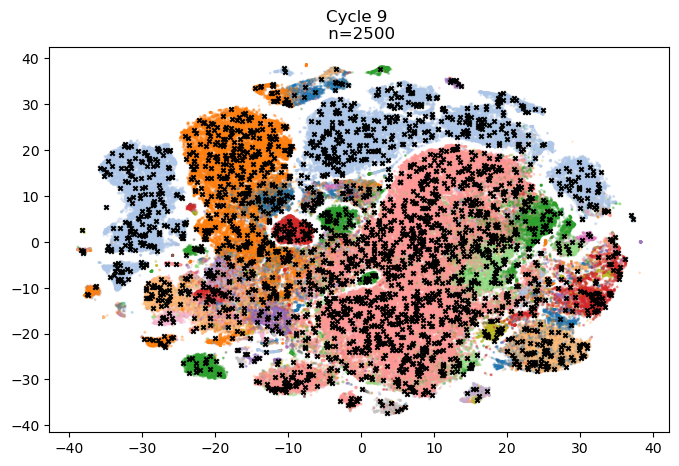

In [12]:
for i in range(10):
    fig, ax = plt.subplots(figsize=(8,5))
    ax.scatter(tsne_embeddings[i][:,0],tsne_embeddings[i][:,1],c=features_label[i],s=1,cmap='tab20',alpha=0.2)
    ax.scatter(tsne_embeddings[i][sampled_indices_position[i],0],tsne_embeddings[i][sampled_indices_position[i],1],c='black',s=10,marker='x')
    ax.set_title(f'Cycle {i} \n n={len(tsne_embeddings[i][sampled_indices_position[i],0])}')
               

In [53]:
[pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

[]

In [232]:
tsne_embeddings
cylce = 9
colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
min_lim = np.min(tsne_embeddings[cycle])
max_lim = np.max(tsne_embeddings[cycle])
fig, axes = plt.subplots(6,8,figsize=(50, 50),dpi=300)
for i,ax in enumerate(axes.flatten()):
    if i >=46:
        continue
    positions = np.where(features_label[cycle]== i)
    np.where(features_label[cycle].any() in sampled_indices_position[cycle])
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[cycle][positions]
    sampled_tsne_embeddings_i = [pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.scatter(tsne_embeddings[cycle][sampled_tsne_embeddings_i,0], tsne_embeddings[cycle][sampled_tsne_embeddings_i,1], c='black',s=30, marker='x')
    ax.set_title(f'Class {lut.name[i]}')
    ax.set_xlim(min_lim, max_lim)
    ax.set_ylim(min_lim, max_lim)

fig.suptitle(f'Label Dispersion',fontsize=40)
plt.savefig(f'plots/Embedding_labeldispersion.png')
plt.show()

/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1197/1218091825.py:20: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])


/var/folders/5f/83w09gxd6pq0h169x9168wcw0000gn/T/ipykernel_1197/2951269378.py:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])


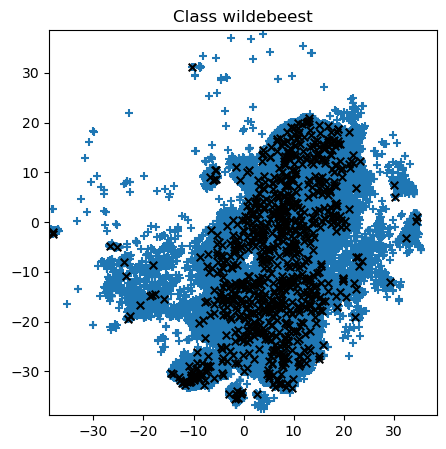

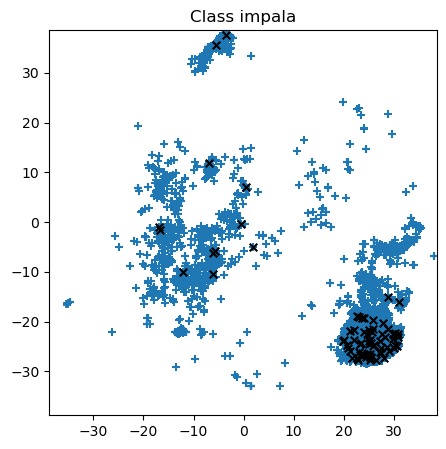

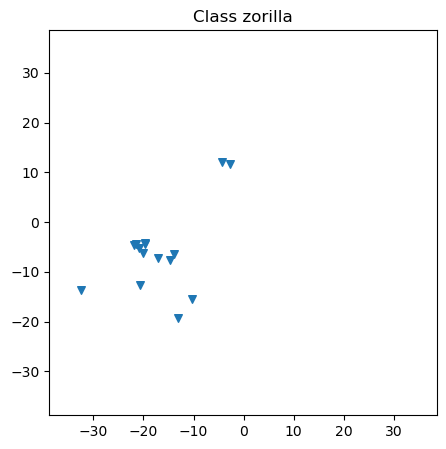

In [235]:
cylce = 9
colors = plt.get_cmap('tab20').colors
markers = ['+','x','v']
min_lim = np.min(tsne_embeddings[cycle])
max_lim = np.max(tsne_embeddings[cycle])
for i in [16,8,43]:
    fig, ax = plt.subplots(figsize=(5, 5))
    positions = np.where(features_label[cycle]== i)
    np.where(features_label[cycle].any() in sampled_indices_position[cycle])
    # if len(positions[0]) > 50:
    #     positions = positions[0][:50]
    # else:
    #     positions = positions[0]
    tsne_embeddings_i = tsne_embeddings[cycle][positions]
    sampled_tsne_embeddings_i = [pos for pos in positions[0] if pos in sampled_indices_position[cycle]]

    ax.scatter(tsne_embeddings_i[:,0], tsne_embeddings_i[:,1], cmap=colors[i%20] ,s=30, marker=markers[i//20])
    ax.scatter(tsne_embeddings[cycle][sampled_tsne_embeddings_i,0], tsne_embeddings[cycle][sampled_tsne_embeddings_i,1], c='black',s=30, marker='x')
    ax.set_title(f'Class {lut.name[i]}')
    ax.set_xlim(min_lim, max_lim)
    ax.set_ylim(min_lim, max_lim)
    plt.savefig(f'plots/Embedding_labeldispersion_{lut.name[i]}.png', bbox_inches='tight')

In [105]:

colors

((0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.74117647

In [4]:
train_df = pd.read_pickle(f'/Volumes/data01/waitsun/snapshotSerengetiCropedResized/df_metadata_train.df')
train_df


,img_name,bbox_pixel_level,category_id,resized_name
0,S1/L07/L07_R1/S1_L07_R1_PICT0103,"[178.91328, 0.0, 1585.9712, 1440.9216000000001]",11,S1/L07/L07_R1/S1_L07_R1_PICT0103_0
1,S1/L07/L07_R1/S1_L07_R1_PICT0234,"[1268.1216, 0.0, 771.8912, 1408.8192]",11,S1/L07/L07_R1/S1_L07_R1_PICT0234_1
2,S1/L07/L07_R1/S1_L07_R1_PICT0072,"[33.32096, 0.0, 2014.6176, 1446.2975999999999]",9,S1/L07/L07_R1/S1_L07_R1_PICT0072_2
3,S1/L07/L07_R1/S1_L07_R1_PICT0020,"[0.3639296, 1133.4144000000001, 131.21536, 300...",16,S1/L07/L07_R1/S1_L07_R1_PICT0020_3
4,S1/L07/L07_R1/S1_L07_R1_PICT0122,"[719.872, 14.737919999999999, 1327.9232, 1253....",11,S1/L07/L07_R1/S1_L07_R1_PICT0122_4
...,...,...,...,...
1094425,S5/K02/K02_R3/S5_K02_R3_IMAG0087,"[1830.912, 69.2736, 216.8832, 1012.0704000000001]",11,S5/K02/K02_R3/S5_K02_R3_IMAG0087_1461185
1094426,S5/K02/K02_R3/S5_K02_R3_IMAG0279,"[11.917312, 89.3184, 648.3968, 1373.184]",3,S5/K02/K02_R3/S5_K02_R3_IMAG0279_1461186
1094427,S5/K02/K02_R3/S5_K02_R3_IMAG0301,"[0.0, 390.60480000000007, 1208.5248, 804.55680...",13,S5/K02/K02_R3/S5_K02_R3_IMAG0301_1461187
1094428,S5/K02/K02_R3/S5_K02_R3_IMAG0146,"[2.7648, 277.8624, 535.1424, 1157.0688]",16,S5/K02/K02_R3/S5_K02_R3_IMAG0146_1461188


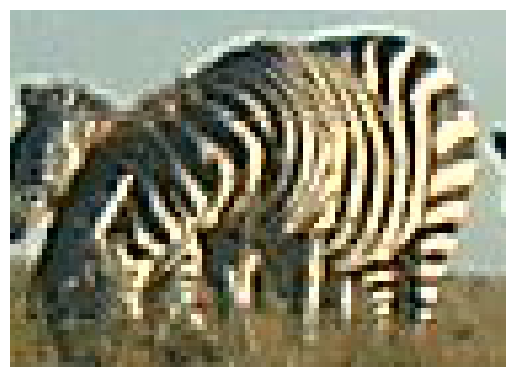

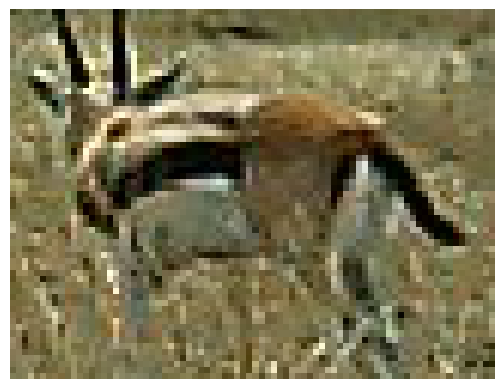

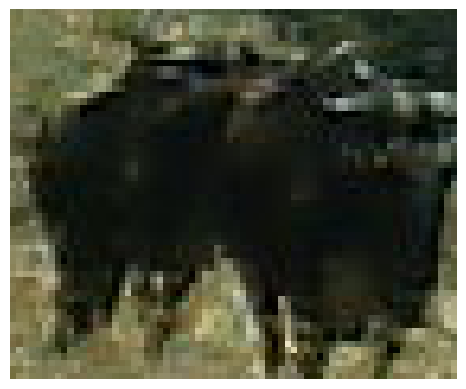

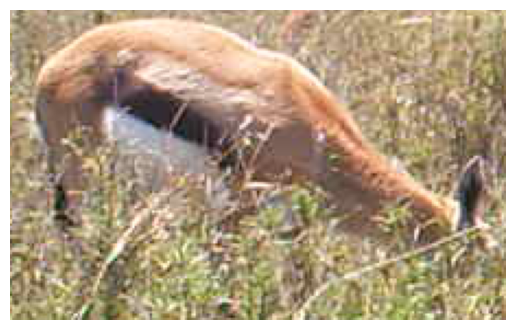

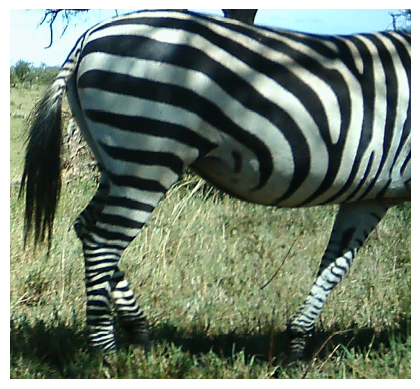

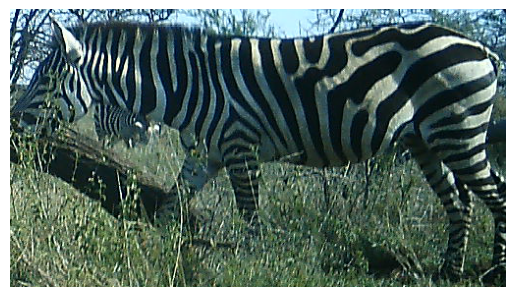

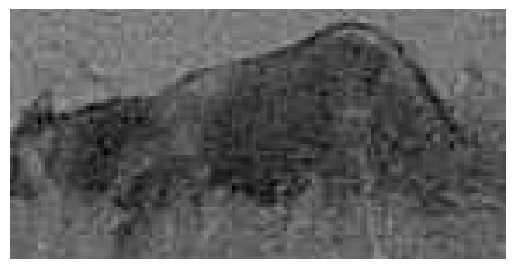

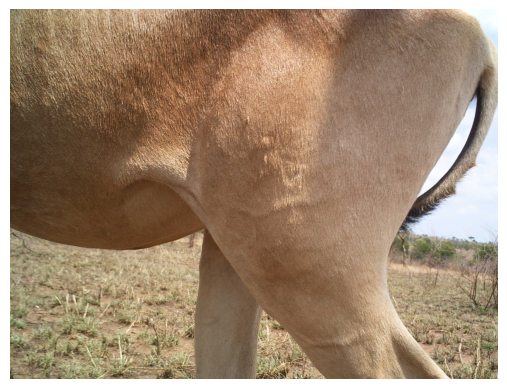

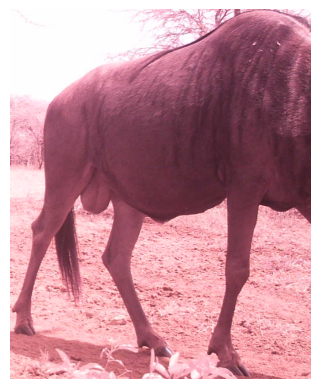

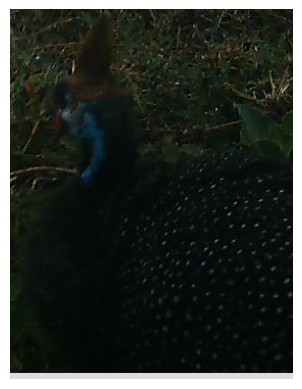

In [12]:
import PIL.Image as Image
import os 
import torchvision.transforms as T
root_dir = '/Volumes/data01/waitsun/snapshotSerengeti'
picks = np.random.choice(labeled_indices[0],10)
for num, idx in enumerate(picks):
    img_name = os.path.join(root_dir,train_df.iloc[idx, 0]+'.JPG')

    image = Image.open(img_name)
    #image = Image.new('RGB',(128, 128))
    #image = pyvips.Image.new_from_file(img_name, access='sequential')
    bbox_im = train_df.iloc[idx, 1]
    image_croped = T.functional.crop(
        image, int(bbox_im[1]), int(bbox_im[0]), int(bbox_im[3]), int(bbox_im[2])) # top, left, height, width

    plt.imshow(image_croped)
    plt.axis('off')
    plt.savefig(f'plots/Embedding_labeldispersion_samples_{num}.png')
    plt.show()